## Customer in a "*Box*"
### - simulating customer trajectories in a brick-and-mortar store

## 1. single customer tracking

In [1]:
from dot_gen import dot, dot1_full_track
from dot_util import traj_1dot_show, movie_1dot_gen
import pandas as pd

### 1.1 simulating tracking data

In [2]:
Steps, X_coors, Y_coors = dot1_full_track()

total steps: 151
initial coordinate: (0.5, 6)
final coordinate: (0.981, 2.116)


In [3]:
type(Steps), type(X_coors), type(Y_coors)

(list, list, list)

In [4]:
len(Steps), len(X_coors), len(Y_coors)

(151, 151, 151)

In [5]:
df = pd.DataFrame({'step': Steps, 'x': X_coors, 'y': Y_coors})
df.head(3)

,step,x,y
0,1,0.981,6.046
1,2,1.461,6.091
2,3,1.942,6.137


```
Note:

entry point is (0.5, 6)
exit zone is a rectangle, (0, 3) (1, 2) as shown in the 2D map 
the dot will stop moving once inside the exit zone
```

<Figure size 640x480 with 0 Axes>

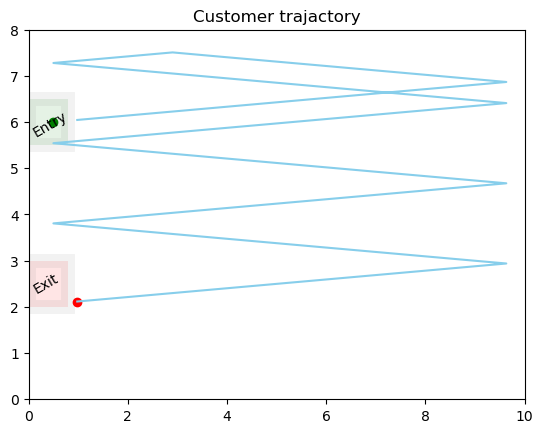

In [6]:
traj_1dot_show(X_coors, Y_coors)

In [7]:
traj = movie_1dot_gen(Steps, X_coors, Y_coors)
traj

In [8]:
traj.save('demo_1dot_tracking.mp4', writer = 'ffmpeg', fps = 30)

## 2. Synthesize tracking data of multiple customers

In [9]:
from dot_gen import dots_df_gen

In [10]:
customer_num = 3
dfs = dots_df_gen(customer_num)

total steps: 507
initial coordinate: (0.5, 6)
final coordinate: (0.94, 2.863)
total steps: 159
initial coordinate: (0.5, 6)
final coordinate: (0.961, 2.121)
total steps: 59
initial coordinate: (0.5, 6)
final coordinate: (0.822, 2.035)


In [11]:
dfs.head()

,id,step,x,y
0,0,1,0.647,6.241
1,0,2,0.793,6.483
2,0,3,0.940,6.724
3,0,4,1.086,6.965
4,0,5,1.233,7.207


### 2.1 customer dwell time

In [12]:
print('number of customer in this dataset:', dfs.id.nunique())

number of customer in this dataset: 3


In [13]:
for i in dfs.id.unique():
    print('customer id:', i)
    print('customer dwell time (step):', len(dfs[dfs.id==i]))
    print()

customer id: 0
customer dwell time (step): 507

customer id: 1
customer dwell time (step): 159

customer id: 2
customer dwell time (step): 59



## 3. Visualize multiple customers

In [14]:
from dot_util import traj_dots_show, movie_dots_gen

<Figure size 640x480 with 0 Axes>

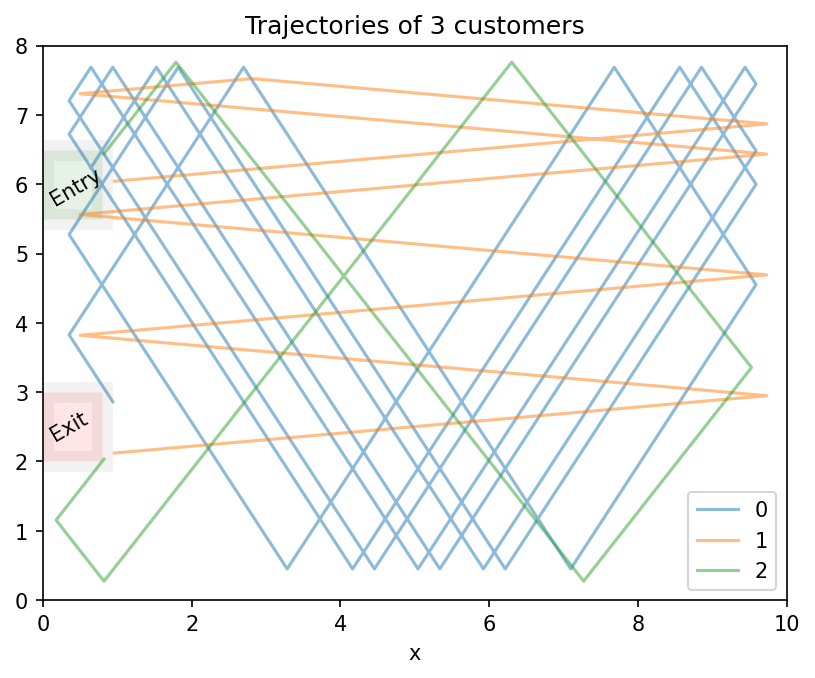

In [15]:
traj_dots_show(dfs)

In [16]:
trajs = movie_dots_gen(dfs)
trajs

In [18]:
trajs.save('demo_multi_dots_tracking.mp4', writer = 'ffmpeg', fps = 30)

## 4. Ending remarks
- this code sample is to simulate customer movement in a confined space
- the result includes data synthesis and visualization
- Improvement
    - Trajectory is more like particle movement (bouncing in a box) than real human behaviors
    - To do: animation for the trajectories of multiple customers